# Hierarchical Clustering - (Project On Travel Review Segmentation)

## Problem Statement:
### Understanding the tastes of each user and the characteristics of each product is necessary to predict how a user will respond to a new product. This latent user and product dimensions can be discovered with the help of user feedback. A numeric rating and its accompanying text review is the most widely available form of user feedback. A measure which encapsulates the contents of such reviews is often necessary as they have been found to significantly influence the shopping behaviour of users. A fine-grained form of such measure that could act as perfect feedback about the product is a star rating. The review rating prediction tries to predict a rating corresponding to the given review.
### Given the google rating data, use a hierarchical clustering algorithm to cluster reviews.

In [1]:
# 1. Import Necessary Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# 2. Import Data
df=pd.read_csv('google_review_ratings.csv')

#### 3. EDA

In [3]:
df

,User,Category 1,Category 2,Category 3,Category 4,Category 5,Category 6,Category 7,Category 8,Category 9,...,Category 16,Category 17,Category 18,Category 19,Category 20,Category 21,Category 22,Category 23,Category 24,Unnamed: 25
0,User 1,0.00,0.00,3.63,3.65,5.00,2.92,5.00,2.35,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,NaN
1,User 2,0.00,0.00,3.63,3.65,5.00,2.92,5.00,2.64,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,NaN
2,User 3,0.00,0.00,3.63,3.63,5.00,2.92,5.00,2.64,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,NaN
3,User 4,0.00,0.50,3.63,3.63,5.00,2.92,5.00,2.35,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,NaN
4,User 5,0.00,0.00,3.63,3.63,5.00,2.92,5.00,2.64,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5451,User 5452,0.91,5.00,4.00,2.79,2.77,2.57,2.43,1.09,1.77,...,0.66,0.65,0.66,0.69,5.00,1.05,5.0,5.0,1.56,NaN
5452,User 5453,0.93,5.00,4.02,2.79,2.78,2.57,1.77,1.07,1.76,...,0.65,0.64,0.65,1.59,1.62,1.06,5.0,5.0,1.09,NaN
5453,User 5454,0.94,5.00,4.03,2.80,2.78,2.57,1.75,1.05,1.75,...,0.65,0.63,0.64,0.74,5.00,1.07,5.0,5.0,1.11,NaN
5454,User 5455,0.95,4.05,4.05,2.81,2.79,2.44,1.76,1.03,1.74,...,0.64,0.63,0.64,0.75,5.00,1.08,5.0,5.0,1.12,NaN


In [4]:
Column_Name = ['User','Church','Resort','Beach','Park','Theater','Museum','Mall','Zoo','Restaurant','Pub/Bar','Local Services','Burger/Pizza Shop','Hotel/Other Lodging','Juice Bar','Art Gallery','Dance Club','Swimming Pool','Gym','Bakery','Beauty & Spa','Cafe','Viewpoint','Monument','Garden','Error']

In [5]:
df.columns=Column_Name


In [6]:
df

,User,Church,Resort,Beach,Park,Theater,Museum,Mall,Zoo,Restaurant,...,Dance Club,Swimming Pool,Gym,Bakery,Beauty & Spa,Cafe,Viewpoint,Monument,Garden,Error
0,User 1,0.00,0.00,3.63,3.65,5.00,2.92,5.00,2.35,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,NaN
1,User 2,0.00,0.00,3.63,3.65,5.00,2.92,5.00,2.64,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,NaN
2,User 3,0.00,0.00,3.63,3.63,5.00,2.92,5.00,2.64,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,NaN
3,User 4,0.00,0.50,3.63,3.63,5.00,2.92,5.00,2.35,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,NaN
4,User 5,0.00,0.00,3.63,3.63,5.00,2.92,5.00,2.64,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5451,User 5452,0.91,5.00,4.00,2.79,2.77,2.57,2.43,1.09,1.77,...,0.66,0.65,0.66,0.69,5.00,1.05,5.0,5.0,1.56,NaN
5452,User 5453,0.93,5.00,4.02,2.79,2.78,2.57,1.77,1.07,1.76,...,0.65,0.64,0.65,1.59,1.62,1.06,5.0,5.0,1.09,NaN
5453,User 5454,0.94,5.00,4.03,2.80,2.78,2.57,1.75,1.05,1.75,...,0.65,0.63,0.64,0.74,5.00,1.07,5.0,5.0,1.11,NaN
5454,User 5455,0.95,4.05,4.05,2.81,2.79,2.44,1.76,1.03,1.74,...,0.64,0.63,0.64,0.75,5.00,1.08,5.0,5.0,1.12,NaN


In [7]:
df.drop('Error',axis=1,inplace=True)

In [8]:
df

,User,Church,Resort,Beach,Park,Theater,Museum,Mall,Zoo,Restaurant,...,Art Gallery,Dance Club,Swimming Pool,Gym,Bakery,Beauty & Spa,Cafe,Viewpoint,Monument,Garden
0,User 1,0.00,0.00,3.63,3.65,5.00,2.92,5.00,2.35,2.33,...,1.74,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00
1,User 2,0.00,0.00,3.63,3.65,5.00,2.92,5.00,2.64,2.33,...,1.74,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00
2,User 3,0.00,0.00,3.63,3.63,5.00,2.92,5.00,2.64,2.33,...,1.74,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00
3,User 4,0.00,0.50,3.63,3.63,5.00,2.92,5.00,2.35,2.33,...,1.74,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00
4,User 5,0.00,0.00,3.63,3.63,5.00,2.92,5.00,2.64,2.33,...,1.74,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5451,User 5452,0.91,5.00,4.00,2.79,2.77,2.57,2.43,1.09,1.77,...,5.00,0.66,0.65,0.66,0.69,5.00,1.05,5.0,5.0,1.56
5452,User 5453,0.93,5.00,4.02,2.79,2.78,2.57,1.77,1.07,1.76,...,0.89,0.65,0.64,0.65,1.59,1.62,1.06,5.0,5.0,1.09
5453,User 5454,0.94,5.00,4.03,2.80,2.78,2.57,1.75,1.05,1.75,...,0.87,0.65,0.63,0.64,0.74,5.00,1.07,5.0,5.0,1.11
5454,User 5455,0.95,4.05,4.05,2.81,2.79,2.44,1.76,1.03,1.74,...,5.00,0.64,0.63,0.64,0.75,5.00,1.08,5.0,5.0,1.12


In [9]:
df.transpose()

,0,1,2,3,4,5,6,7,8,9,...,5446,5447,5448,5449,5450,5451,5452,5453,5454,5455
User,User 1,User 2,User 3,User 4,User 5,User 6,User 7,User 8,User 9,User 10,...,User 5447,User 5448,User 5449,User 5450,User 5451,User 5452,User 5453,User 5454,User 5455,User 5456
Church,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.32,4.59,4.6,1.65,0.91,0.91,0.93,0.94,0.95,0.95
Resort,0.0,0.0,0.0,0.5,0.0,0.0,5.0,5.0,5.0,5.0,...,3.87,3.88,5.0,3.93,3.94,5.0,5.0,5.0,4.05,4.07
Beach,3.63,3.63,3.63,3.63,3.63,3.63,3.63,3.63,3.64,3.64,...,3.91,3.92,3.94,3.96,3.98,4.0,4.02,4.03,4.05,5.0
Park,3.65,3.65,3.63,3.63,3.63,3.63,3.63,3.63,3.64,3.64,...,2.75,2.76,2.77,2.77,2.78,2.79,2.79,2.8,2.81,2.82
Theater,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,...,2.74,2.74,2.75,2.76,2.76,2.77,2.78,2.78,2.79,2.8
Museum,2.92,2.92,2.92,2.92,2.92,2.92,2.92,2.92,2.92,2.92,...,2.33,2.33,2.69,2.34,2.57,2.57,2.57,2.57,2.44,2.57
Mall,5.0,5.0,5.0,5.0,5.0,5.0,3.03,5.0,3.03,5.0,...,2.45,2.45,2.45,2.44,2.44,2.43,1.77,1.75,1.76,2.42
Zoo,2.35,2.64,2.64,2.35,2.64,2.63,2.35,2.63,2.62,2.35,...,1.18,1.16,1.14,1.13,1.11,1.09,1.07,1.05,1.03,1.02
Restaurant,2.33,2.33,2.33,2.33,2.33,2.33,2.33,2.33,2.32,2.32,...,5.0,5.0,1.13,1.79,1.78,1.77,1.76,1.75,1.74,1.74


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   User                 5456 non-null   object 
 1   Church               5456 non-null   float64
 2   Resort               5456 non-null   float64
 3   Beach                5456 non-null   float64
 4   Park                 5456 non-null   float64
 5   Theater              5456 non-null   float64
 6   Museum               5456 non-null   float64
 7   Mall                 5456 non-null   float64
 8   Zoo                  5456 non-null   float64
 9   Restaurant           5456 non-null   float64
 10  Pub/Bar              5456 non-null   float64
 11  Local Services       5456 non-null   object 
 12  Burger/Pizza Shop    5455 non-null   float64
 13  Hotel/Other Lodging  5456 non-null   float64
 14  Juice Bar            5456 non-null   float64
 15  Art Gallery          5456 non-null   f

In [11]:
df['Local Services'].unique()

array(['1.7', '1.73', '1.71', '1.69', '1.67', '1.65', '1.66', '1.64',
       '1.63', '5', '1.56', '1.55', '1.53', '1.52', '1.51', '1.5', '1.49',
       '1.48', '1.46', '2.13', '2.12', '2.1', '2.09', '2.08', '2.07',
       '2.06', '2.05', '2.04', '2.03', '2.01', '2', '1.98', '1.97',
       '1.95', '1.93', '1.91', '1.9', '1.88', '1.86', '1.84', '1.83',
       '1.81', '1.79', '1.77', '1.74', '1.72', '1.68', '1.61', '1.6',
       '1.59', '1.58', '1.99', '2.47', '2.35', '2.48', '2.59', '3.39',
       '2.31', '2.78', '2.79', '2.77', '2.76', '2.75', '2.74', '2.72',
       '2.71', '2.69', '2.68', '2.66', '2.65', '2.63', '2.61', '2.57',
       '2.55', '2.53', '2.51', '2.49', '1.94', '1.92', '1.82', '1.76',
       '1.62', '4.08', '4.04', '4.02', '4.01', '4', '3.99', '3.98',
       '3.96', '3.95', '3.94', '3.93', '3.91', '3.9', '3.88', '3.87',
       '3.86', '3.84', '3.85', '2.17', '3', '2.99', '2.82', '2.83',
       '2.81', '2.8', '2.73', '2.67', '2.64', '2.62', '2.54', '2.52',
       '2.5', '2.

In [12]:
# Finding the Value '2\t2.'
# df['Local Services'].locate(['2\t2.'])

In [13]:
df['Local Services']

0        1.7
1        1.7
2        1.7
3       1.73
4        1.7
        ... 
5451    1.02
5452    1.01
5453    0.99
5454    0.97
5455    0.95
Name: Local Services, Length: 5456, dtype: object

In [14]:
df['Local Services']=df['Local Services'].replace(['2\t2.'],'2.222')

In [15]:
pf=df.astype({'Local Services':float})

In [16]:
df=pf

In [17]:
df['Local Services']=df['Local Services'].replace([2.222],df['Local Services'].mean())

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5456 entries, 0 to 5455
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   User                 5456 non-null   object 
 1   Church               5456 non-null   float64
 2   Resort               5456 non-null   float64
 3   Beach                5456 non-null   float64
 4   Park                 5456 non-null   float64
 5   Theater              5456 non-null   float64
 6   Museum               5456 non-null   float64
 7   Mall                 5456 non-null   float64
 8   Zoo                  5456 non-null   float64
 9   Restaurant           5456 non-null   float64
 10  Pub/Bar              5456 non-null   float64
 11  Local Services       5456 non-null   float64
 12  Burger/Pizza Shop    5455 non-null   float64
 13  Hotel/Other Lodging  5456 non-null   float64
 14  Juice Bar            5456 non-null   float64
 15  Art Gallery          5456 non-null   f

In [32]:
df.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
User,5456,5456,User 1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Church,5456.0,NaN,NaN,NaN,1.45572,0.827604,0.0,0.92,1.34,1.81,5.0
Resort,5456.0,NaN,NaN,NaN,2.319707,1.421438,0.0,1.36,1.905,2.6825,5.0
Beach,5456.0,NaN,NaN,NaN,2.489331,1.247815,0.0,1.54,2.06,2.74,5.0
Park,5456.0,NaN,NaN,NaN,2.796886,1.309159,0.83,1.73,2.46,4.0925,5.0
Theater,5456.0,NaN,NaN,NaN,2.958941,1.339056,1.12,1.77,2.67,4.3125,5.0
Museum,5456.0,NaN,NaN,NaN,2.89349,1.2824,1.11,1.79,2.68,3.84,5.0
Mall,5456.0,NaN,NaN,NaN,3.351395,1.413492,1.12,1.93,3.23,5.0,5.0
Zoo,5456.0,NaN,NaN,NaN,2.540795,1.111391,0.86,1.62,2.17,3.19,5.0
Restaurant,5456.0,NaN,NaN,NaN,3.126019,1.356802,0.84,1.8,2.8,5.0,5.0


In [19]:
# Finding the Missing Values
df.isnull().sum()

User                   0
Church                 0
Resort                 0
Beach                  0
Park                   0
Theater                0
Museum                 0
Mall                   0
Zoo                    0
Restaurant             0
Pub/Bar                0
Local Services         0
Burger/Pizza Shop      1
Hotel/Other Lodging    0
Juice Bar              0
Art Gallery            0
Dance Club             0
Swimming Pool          0
Gym                    0
Bakery                 0
Beauty & Spa           0
Cafe                   0
Viewpoint              0
Monument               0
Garden                 1
dtype: int64

In [20]:
# Replaceing the Missing Values
df['Burger/Pizza Shop']=df['Burger/Pizza Shop'].replace([np.NaN],df['Burger/Pizza Shop'].median())
df['Garden']=df['Garden'].replace([np.NaN],df['Garden'].median())
df.isnull().sum() #Checking for Missing Values

User                   0
Church                 0
Resort                 0
Beach                  0
Park                   0
Theater                0
Museum                 0
Mall                   0
Zoo                    0
Restaurant             0
Pub/Bar                0
Local Services         0
Burger/Pizza Shop      0
Hotel/Other Lodging    0
Juice Bar              0
Art Gallery            0
Dance Club             0
Swimming Pool          0
Gym                    0
Bakery                 0
Beauty & Spa           0
Cafe                   0
Viewpoint              0
Monument               0
Garden                 0
dtype: int64

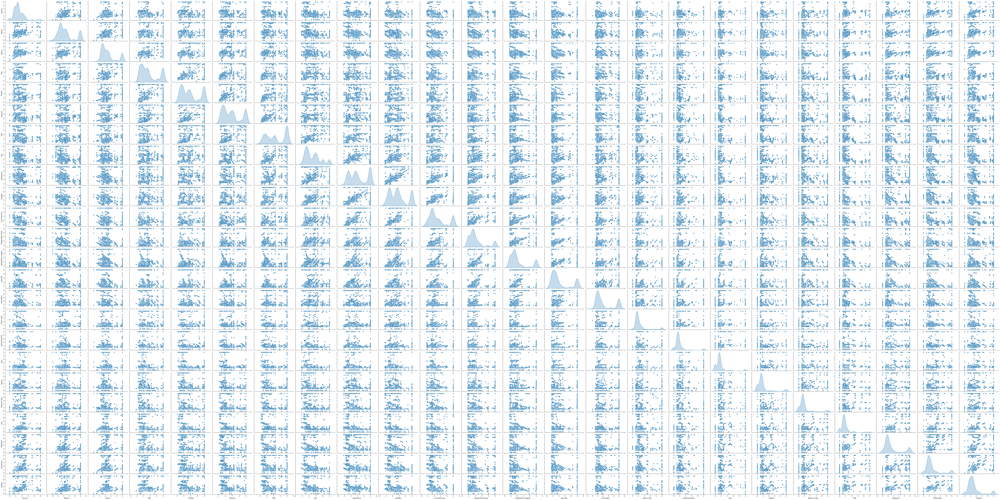

In [46]:
# Visualization of Pairplot 
sns.pairplot(df, height=2,aspect=2,diag_kind='kde')

In [21]:
# Normalizing the Data
pdf=df.drop(['User'],axis=1)
from sklearn.preprocessing import normalize
ndf = normalize(pdf)
ndf = pd.DataFrame(ndf,columns=pdf.columns)
ndf.head(6)

,Church,Resort,Beach,Park,Theater,Museum,Mall,Zoo,Restaurant,Pub/Bar,...,Art Gallery,Dance Club,Swimming Pool,Gym,Bakery,Beauty & Spa,Cafe,Viewpoint,Monument,Garden
0,0.0,0.000000,0.333580,0.335418,0.459476,0.268334,0.459476,0.215954,0.214116,0.242603,...,0.159898,0.054218,0.045948,0.0,0.045948,0.0,0.0,0.0,0.0,0.0
1,0.0,0.000000,0.331487,0.333313,0.456593,0.266651,0.456593,0.241081,0.212773,0.241995,...,0.158895,0.053878,0.045659,0.0,0.045659,0.0,0.0,0.0,0.0,0.0
2,0.0,0.000000,0.331762,0.331762,0.456972,0.266872,0.456972,0.241281,0.212949,0.241281,...,0.159026,0.053923,0.045697,0.0,0.045697,0.0,0.0,0.0,0.0,0.0
3,0.0,0.045907,0.333288,0.333288,0.459075,0.268100,0.459075,0.215765,0.213929,0.242391,...,0.159758,0.054171,0.045907,0.0,0.045907,0.0,0.0,0.0,0.0,0.0
4,0.0,0.000000,0.331762,0.331762,0.456972,0.266872,0.456972,0.241281,0.212949,0.241281,...,0.159026,0.053923,0.045697,0.0,0.045697,0.0,0.0,0.0,0.0,0.0
5,0.0,0.000000,0.331761,0.331761,0.456971,0.266871,0.456971,0.240367,0.212948,0.242195,...,0.159026,0.053923,0.045697,0.0,0.045697,0.0,0.0,0.0,0.0,0.0


In [22]:
ndf

,Church,Resort,Beach,Park,Theater,Museum,Mall,Zoo,Restaurant,Pub/Bar,...,Art Gallery,Dance Club,Swimming Pool,Gym,Bakery,Beauty & Spa,Cafe,Viewpoint,Monument,Garden
0,0.000000,0.000000,0.333580,0.335418,0.459476,0.268334,0.459476,0.215954,0.214116,0.242603,...,0.159898,0.054218,0.045948,0.000000,0.045948,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.331487,0.333313,0.456593,0.266651,0.456593,0.241081,0.212773,0.241995,...,0.158895,0.053878,0.045659,0.000000,0.045659,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.331762,0.331762,0.456972,0.266872,0.456972,0.241281,0.212949,0.241281,...,0.159026,0.053923,0.045697,0.000000,0.045697,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.045907,0.333288,0.333288,0.459075,0.268100,0.459075,0.215765,0.213929,0.242391,...,0.159758,0.054171,0.045907,0.000000,0.045907,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.331762,0.331762,0.456972,0.266872,0.456972,0.241281,0.212949,0.241281,...,0.159026,0.053923,0.045697,0.000000,0.045697,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5451,0.066725,0.366622,0.293298,0.204575,0.203109,0.188444,0.178178,0.079924,0.129784,0.076257,...,0.366622,0.048394,0.047661,0.048394,0.050594,0.366622,0.076991,0.366622,0.366622,0.114386
5452,0.079340,0.426561,0.342955,0.238021,0.237168,0.219253,0.151003,0.091284,0.150150,0.087019,...,0.075928,0.055453,0.054600,0.055453,0.135647,0.138206,0.090431,0.426561,0.426561,0.092990
5453,0.074986,0.398860,0.321481,0.223361,0.221766,0.205014,0.139601,0.083761,0.139601,0.079772,...,0.069402,0.051852,0.050256,0.051054,0.059031,0.398860,0.085356,0.398860,0.398860,0.088547
5454,0.072389,0.308608,0.308608,0.214120,0.212596,0.185927,0.134111,0.078485,0.132587,0.074675,...,0.380997,0.048768,0.048006,0.048768,0.057150,0.380997,0.082295,0.380997,0.380997,0.085343


#### Model 1:
##### 1. Hierarchical Clustering

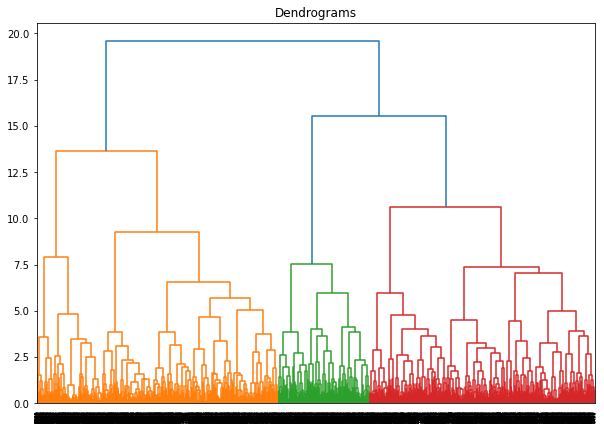

In [23]:
# Dendogram
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(ndf, method='ward'))

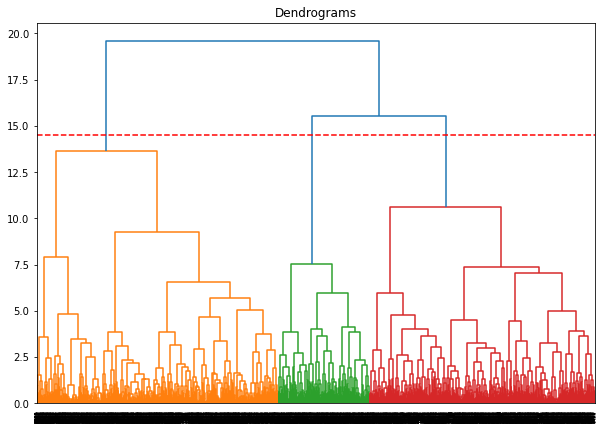

In [25]:
# Dendogram with line
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(ndf, method='ward'))
plt.axhline(y=14.5, color='r', linestyle='--')

In [26]:
# Agglomerative Clustering Model
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')  
cluster.fit_predict(ndf)

array([1, 1, 1, ..., 2, 2, 2], dtype=int64)

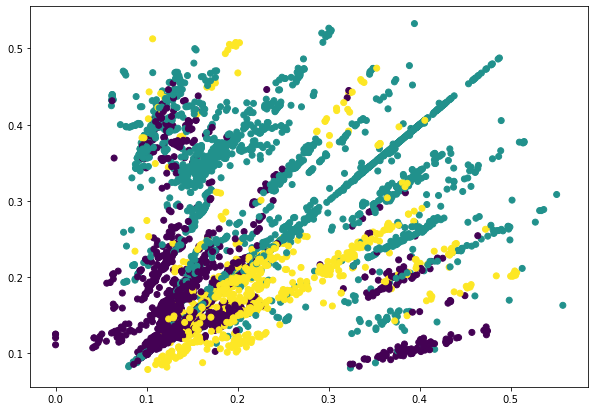

In [35]:
# Visualization of Cluster Model
plt.figure(figsize=(10, 7))  
plt.scatter(ndf['Beach'], ndf['Park'], c=cluster.labels_) 

In [36]:
# Retrieve the Clusters
odf=df.copy(deep=True)
odf['Cluster']=cluster.labels_
odf

,User,Church,Resort,Beach,Park,Theater,Museum,Mall,Zoo,Restaurant,...,Dance Club,Swimming Pool,Gym,Bakery,Beauty & Spa,Cafe,Viewpoint,Monument,Garden,Cluster
0,User 1,0.00,0.00,3.63,3.65,5.00,2.92,5.00,2.35,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,1
1,User 2,0.00,0.00,3.63,3.65,5.00,2.92,5.00,2.64,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,1
2,User 3,0.00,0.00,3.63,3.63,5.00,2.92,5.00,2.64,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,1
3,User 4,0.00,0.50,3.63,3.63,5.00,2.92,5.00,2.35,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,1
4,User 5,0.00,0.00,3.63,3.63,5.00,2.92,5.00,2.64,2.33,...,0.59,0.50,0.00,0.50,0.00,0.00,0.0,0.0,0.00,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5451,User 5452,0.91,5.00,4.00,2.79,2.77,2.57,2.43,1.09,1.77,...,0.66,0.65,0.66,0.69,5.00,1.05,5.0,5.0,1.56,2
5452,User 5453,0.93,5.00,4.02,2.79,2.78,2.57,1.77,1.07,1.76,...,0.65,0.64,0.65,1.59,1.62,1.06,5.0,5.0,1.09,1
5453,User 5454,0.94,5.00,4.03,2.80,2.78,2.57,1.75,1.05,1.75,...,0.65,0.63,0.64,0.74,5.00,1.07,5.0,5.0,1.11,2
5454,User 5455,0.95,4.05,4.05,2.81,2.79,2.44,1.76,1.03,1.74,...,0.64,0.63,0.64,0.75,5.00,1.08,5.0,5.0,1.12,2


In [37]:
# Check the size of each cluster
np.unique(cluster.labels_, return_counts=True) 

(array([0, 1, 2], dtype=int64), array([2367, 2201,  888], dtype=int64))

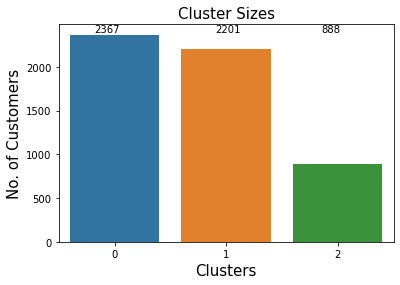

In [42]:
# Visualize the size of each cluster
sns.countplot(data= odf, x = 'Cluster')

# set the axes and plot labels
# set the font size using 'fontsize'
plt.title('Cluster Sizes', fontsize = 15)
plt.xlabel('Clusters', fontsize = 15)
plt.ylabel('No. of Customers', fontsize = 15)

# add values in the graph
# 'x' and 'y' assigns the position to the text
# 's' represents the text on the plot
plt.text(x = -0.18, y =2400, s = np.unique(cluster.labels_, return_counts=True)[1][0])
plt.text(x = 0.9, y =2400, s = np.unique(cluster.labels_, return_counts=True)[1][1])
plt.text(x = 1.85, y =2400, s = np.unique(cluster.labels_, return_counts=True)[1][2])

plt.show()

### Cluster Analysis
#### 1. Check the size of a cluster.
#### 2. Sort the variables belonging to the cluster.
#### 3. Compute the statistical summary for observations in the cluster.
Sort all the variables based on value for the cluster center (i.e., the variable with the highest value of the cluster center will be on top of the sorted list) and store the first ten variables as a list.

#### Analysis of Cluster 0